In [1]:
## all imports
from IPython.display import HTML
import numpy as np
import urllib.request, urllib.error
import bs4 #this is beautiful soup
import time
import operator
import socket
import pickle
import re # regular expressions

from pandas import Series
import pandas as pd
from pandas import DataFrame

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_context("talk")
sns.set_style("white")

from secrets import *

API registrations
=================

If you would like to run all the examples in this notebook, you need to register for the following APIs:

* Rotten Tomatoes

http://developer.rottentomatoes.com/member/register

* Twitter

https://apps.twitter.com/app/new

* Twitter instructions

https://twittercommunity.com/t/how-to-get-my-api-key/7033

CS109
=====

Verena Kaynig-Fittkau, Joe Blitzstein, Hanspeter Pfister

* vkaynig@seas.harvard.edu
* staff@cs109.org

Announcements
==============

* Over 400 sign ups on github!
* If you are still missing, fill out the survey, time is running out!
* Make sure you are on Piazza!


* More [git help](https://www.youtube.com/channel/UC0-KaiZFXBlGOFN71YsEV8g/videos)


* HW0 is due on Thursday 
* HW1 is coming out on Thursday


Todays lecture:
===============

* introduction to pandas
    - read a table
    - do some plots

* all about data scraping
* ***What is it? ***
* How to do it:
    - from a website
    - with an API

Answer: Data scraping is about obtaining data from webpages. There is low level scraping where you parse the data out of the html code of the webpage. There also is scraping over APIs from websites who try to make your life a bit easier.

IPython Notebooks:
===================

![IPython](images/ipython.png "IPython")

IPython Notebooks:
===================

* These slides are an IPython notebook!
* https://github.com/damianavila/live_reveal

In [2]:
print ("Hello CS109")

print ("I love IPython")

# Ipython notebook have tab completion!
# and inbuild help
  
a = np.zeros(3)
a

Hello CS109
I love IPython


array([0., 0., 0.])

General advice about programming
==================================

* You will find nearly everything on google
* Try: length of a list in python
* A programmer is someone who can turn stack overflow snippets into running code
* Use tab completion
* Make your variable names meaningful


How to load a table
===================

* we use Pandas for this
* Pandas can do a __lot__ more
* more about it later

The MovieLens data
===================

http://grouplens.org/datasets/movielens/

![Grouplens](images/grouplens.jpg "Grouplens")

Example inspired by [Greg Reda](http://www.gregreda.com/2013/10/26/using-pandas-on-the-movielens-dataset/)

Read the user data
==================

In [3]:
# pass in column names for each CSV
u_cols = ['user_id', 'age', 'sex', 'occupation', 'zip_code']

users = pd.read_csv(
    'http://files.grouplens.org/datasets/movielens/ml-100k/u.user', 
    sep='|', names=u_cols)

users.head() #first five entries with the names of the columns and de index

,user_id,age,sex,occupation,zip_code
0,1,24,M,technician,85711
1,2,53,F,other,94043
2,3,23,M,writer,32067
3,4,24,M,technician,43537
4,5,33,F,other,15213


Read the ratings
============

In [6]:
r_cols = ['user_id', 'movie_id', 'rating', 'unix_timestamp']
ratings = pd.read_csv(
    'http://files.grouplens.org/datasets/movielens/ml-100k/u.data', 
    sep='\t', names=r_cols)

ratings.head() 

,user_id,movie_id,rating,unix_timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


Now data about the movies
=========================

In [7]:
# the movies file contains columns indicating the movie's genres
# let's only load the first five columns of the file with usecols
m_cols = ['movie_id', 'title', 'release_date', 
            'video_release_date', 'imdb_url']

movies = pd.read_csv(
    'http://files.grouplens.org/datasets/movielens/ml-100k/u.item', 
    sep='|', names=m_cols, usecols=range(5), encoding = "ISO-8859-1")

movies.head()

,movie_id,title,release_date,video_release_date,imdb_url
0,1,Toy Story (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%2...
1,2,GoldenEye (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(...
2,3,Four Rooms (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%...
3,4,Get Shorty (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%...
4,5,Copycat (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995)


Get information about data
=======================

In [8]:
print (movies.dtypes)

print (movies.describe())
# *** Why only those two columns? ***

movie_id                int64
title                  object
release_date           object
video_release_date    float64
imdb_url               object
dtype: object
          movie_id  video_release_date
count  1682.000000                 0.0
mean    841.500000                 NaN
std     485.695893                 NaN
min       1.000000                 NaN
25%     421.250000                 NaN
50%     841.500000                 NaN
75%    1261.750000                 NaN
max    1682.000000                 NaN


Selecting data
==============

* DataFrame => group of Series with shared index
* single DataFrame column => Series

In [16]:
users.head()
users['occupation'].head()
## *** Where did the nice design go? ***
columns_you_want = ['occupation', 'sex'] 

print ("occupation \n", users['occupation'].head())
print ("Selected Columns \n", users[columns_you_want].head())

print (users.head())

print (users.iloc[3]) #accedo a la fila #4

occupation 
 0    technician
1         other
2        writer
3    technician
4         other
Name: occupation, dtype: object
Selected Columns 
    occupation sex
0  technician   M
1       other   F
2      writer   M
3  technician   M
4       other   F
   user_id  age sex  occupation zip_code
0        1   24   M  technician    85711
1        2   53   F       other    94043
2        3   23   M      writer    32067
3        4   24   M  technician    43537
4        5   33   F       other    15213
user_id                4
age                   24
sex                    M
occupation    technician
zip_code           43537
Name: 3, dtype: object


Filtering data
==============

Select users older than 25

In [19]:
users.age > 25 # boolean list
oldUsers = users[users.age > 25] #le pasa a Users solo los TRUE
oldUsers.head()

,user_id,age,sex,occupation,zip_code
1,2,53,F,other,94043
4,5,33,F,other,15213
5,6,42,M,executive,98101
6,7,57,M,administrator,91344
7,8,36,M,administrator,05201


Quiz:
=====

* show users aged 40 and male

* show the mean age of female programmers

In [20]:
age40 = users[users.age==40]
age40.head()
male40 = age40[age40.sex=="M"]
print(male40.head())
oldmale = users[(users.age==40) & (users.sex=="M")] #para hacerlo junto tengo que poner entre () a cada comparacion
print(oldmale.head())

     user_id  age sex  occupation zip_code
18        19   40   M   librarian    02138
82        83   40   M       other    44133
115      116   40   M  healthcare    97232
199      200   40   M  programmer    93402
283      284   40   M   executive    92629
     user_id  age sex  occupation zip_code
18        19   40   M   librarian    02138
82        83   40   M       other    44133
115      116   40   M  healthcare    97232
199      200   40   M  programmer    93402
283      284   40   M   executive    92629


In [21]:
# users aged 40 AND male
users[(users.age == 40) & (users.sex == 'M')].head(3)

,user_id,age,sex,occupation,zip_code
18,19,40,M,librarian,02138
82,83,40,M,other,44133
115,116,40,M,healthcare,97232


In [10]:
femProg = users[(users.sex=="F") & (users.occupation == "programmer")]
femProg.head()

,user_id,age,sex,occupation,zip_code
291,292,35,F,programmer,94703
299,300,26,F,programmer,55106
351,352,37,F,programmer,55105
403,404,29,F,programmer,55108
420,421,38,F,programmer,55105


In [22]:
## users who are female and programmers
selected_users = users[(users.sex == 'F') & 
                       (users.occupation == 'programmer')]

## show statistic summary
print (selected_users.describe())

## alternatives:
print (selected_users.age.mean())
print (selected_users['age'].mean()) #se puede seleccionar la columna con el . o con ['']

          user_id        age
count    6.000000   6.000000
mean   411.166667  32.166667
std    149.987222   5.115336
min    292.000000  26.000000
25%    313.000000  28.250000
50%    378.000000  32.000000
75%    416.750000  36.500000
max    698.000000  38.000000
32.166666666666664
32.166666666666664


Split-apply-combine
===================

* splitting the data into groups based on some criteria
* applying a function to each group independently
* combining the results into a data structure

Split-apply-combine
===================

<img src=http://i.imgur.com/yjNkiwL.png></img>

Find Diligent Users
===================

* split data per user ID
* count ratings
* combine result

In [26]:
print(ratings.dtypes)
print (ratings.head())
## split data
grouped_data = ratings.groupby('user_id') #agrupo por user_id, genero minitablas para cada user_id

## count and combine
ratings_per_user = grouped_data.count() #esto me genera un nuevo dataframe con la cantidad de veces que aparece el mismo user_id y en cada columna de la tabla original (rantings) me aparece esa cantidad

ratings_per_user.head(5) 

user_id           int64
movie_id          int64
rating            int64
unix_timestamp    int64
dtype: object
   user_id  movie_id  rating  unix_timestamp
0      196       242       3       881250949
1      186       302       3       891717742
2       22       377       1       878887116
3      244        51       2       880606923
4      166       346       1       886397596


,movie_id,rating,unix_timestamp
user_id,,,
1,272,272,272
2,62,62,62
3,54,54,54
4,24,24,24
5,175,175,175


por qué pone el resultado de .count() en la columna rating y no en una nueva? o en cualquier otra? 

In [13]:
grouped_data = ratings['movie_id'].groupby(ratings['user_id']) #preselecciono la columna "movie_id" y agrupo por la de user_id
ratings_per_user = grouped_data.count() #entonces me devuelve solamente una columna, y deja de ser un dataframe y pasa a ser una serie porque hay una sola columna.
ratings_per_user.head()

user_id
1    272
2     62
3     54
4     24
5    175
Name: movie_id, dtype: int64

Quiz
====

* get the average rating per movie
* advanced: get the movie titles with the highest average rating

In [35]:
#mio

## split data
movieID = ratings["rating"].groupby(ratings['movie_id'])
movieID.head()
## count and combine
average_ratings= movieID.mean()
print(average_ratings.head())

#second part
maxRatings = average_ratings.max()
print(maxRatings)
good_movie_ids = average_ratings[average_ratings == maxRatings].index
print(good_movie_ids)

#cómo hago para obtener el nombre de las peliculas teniendo el movie_id. Tengo que buscar en la tabla de movies. 


movie_id
1    3.878319
2    3.206107
3    3.033333
4    3.550239
5    3.302326
Name: rating, dtype: float64
5.0
Int64Index([814, 1122, 1189, 1201, 1293, 1467, 1500, 1536, 1599, 1653], dtype='int64', name='movie_id')


In [36]:
## split data
grouped_data = ratings['rating'].groupby(ratings['movie_id'])
## average and combine
average_ratings = grouped_data.mean()
print ("Average ratings:")
print (average_ratings.head())

maximum_rating = average_ratings.max()
good_movie_ids = average_ratings[average_ratings == maximum_rating].index

Average ratings:
movie_id
1    3.878319
2    3.206107
3    3.033333
4    3.550239
5    3.302326
Name: rating, dtype: float64


In [39]:
print ("Good movie ids:")
print (good_movie_ids)
print ("\n")

print(movies.head)
print ("Best movie titles")
print (movies[movies.movie_id.isin(good_movie_ids)].title) #isin(): Whether each element in the DataFrame is contained in values.




Good movie ids:
Int64Index([814, 1122, 1189, 1201, 1293, 1467, 1500, 1536, 1599, 1653], dtype='int64', name='movie_id')


<bound method NDFrame.head of       movie_id                                      title release_date  \
0            1                           Toy Story (1995)  01-Jan-1995   
1            2                           GoldenEye (1995)  01-Jan-1995   
2            3                          Four Rooms (1995)  01-Jan-1995   
3            4                          Get Shorty (1995)  01-Jan-1995   
4            5                             Copycat (1995)  01-Jan-1995   
...        ...                                        ...          ...   
1677      1678                          Mat' i syn (1997)  06-Feb-1998   
1678      1679                           B. Monkey (1998)  06-Feb-1998   
1679      1680                       Sliding Doors (1998)  01-Jan-1998   
1680      1681                        You So Crazy (1994)  01-Jan-1994   
1681      1682  Scream of Stone (S

In [40]:
how_many_ratings = grouped_data.count()
print ("Number of ratings per movie")
print (how_many_ratings[average_ratings == maximum_rating])

Number of ratings per movie
movie_id
814     1
1122    1
1189    3
1201    1
1293    3
1467    2
1500    2
1536    1
1599    1
1653    1
Name: rating, dtype: int64


Passing a Function
==================


In [17]:
average_ratings = grouped_data.apply(lambda f: f.mean()) #lambda es una funcion cualquiera que me invento y no le doy nombre porque solo la uso una vez. En el ejemplo usa mean() pero podria hacer cualquier funcion
average_ratings.head()

movie_id
1    3.878319
2    3.206107
3    3.033333
4    3.550239
5    3.302326
Name: rating, dtype: float64

Quiz
====

* get the average rating per user
* advanced: list all occupations and if they are male or female dominant

In [63]:
#mio
#aprendiendo sobre GroupBy (https://pandas.pydata.org/pandas-docs/stable/user_guide/groupby.html)
df = pd.DataFrame({'A': ['foo', 'bar', 'foo', 'bar', 'foo', 'bar', 'foo', 'foo'],
                    'B': ['one', 'one', 'two', 'three', 'two', 'two', 'one', 'three'],
                    'C': np.random.randn(8),
                    'D': np.random.randn(8)})
#print(df)

grouped = df.groupby(['A', 'B'])
df2 = df.set_index(['A', 'B'])
#print(df2)
grouped = df2.groupby(level=df2.index.names.difference(['B']))
#print(grouped.head())
grouped.sum()

def get_letter_type(letter):
    if letter.lower() in 'aeiou':
        return 'vowel'
    else:
        return 'consonant'
    

grouped2 = df.groupby(get_letter_type, axis=1)

#list(grouped2)

lst = [1, 2, 3, 1, 2, 3]
s = pd.Series([1, 2, 3, 10, 20, 30], lst)
print(s)
grouped = s.groupby(level=0)
list(grouped)


1     1
2     2
3     3
1    10
2    20
3    30
dtype: int64


[(1,
  1     1
  1    10
  dtype: int64),
 (2,
  2     2
  2    20
  dtype: int64),
 (3,
  3     3
  3    30
  dtype: int64)]

In [48]:
#mio
ratings.head()
## split data
grouped_data = ratings['rating'].groupby(ratings['user_id'])
## average and combine
average_rating_perUser = grouped_data.mean()
print(average_rating_perUser.head())


#* advanced: list all occupations and if they are male or female dominant
# divido el dataframe epor ocupaciones y comparo la suma de las M contra la suma de las F de sex.
users.head()

occuBYsex = users['sex'].groupby(users['occupation'])

occupboysDominant = occuBYsex.apply(lambda f:  sum(f == 'M') > sum(f == 'F'))

print("Male dominant occupation \n", occupboysDominant)


user_id
1    3.610294
2    3.709677
3    2.796296
4    4.333333
5    2.874286
Name: rating, dtype: float64
Male dominant occupation 
 occupation
administrator     True
artist            True
doctor            True
educator          True
engineer          True
entertainment     True
executive         True
healthcare       False
homemaker        False
lawyer            True
librarian        False
marketing         True
none              True
other             True
programmer        True
retired           True
salesman          True
scientist         True
student           True
technician        True
writer            True
Name: sex, dtype: bool


In [80]:
grouped_data = ratings['rating'].groupby(ratings['user_id'])
average_ratings = grouped_data.mean()
average_ratings.head()

user_id
1    3.610294
2    3.709677
3    2.796296
4    4.333333
5    2.874286
Name: rating, dtype: float64

In [49]:
grouped_data = users['sex'].groupby(users['occupation'])
print (grouped_data.describe())
male_dominant_occupations = grouped_data.apply(lambda f: 
                                               sum(f == 'M') > sum(f == 'F'))
print (male_dominant_occupations)
print ('\n')

              count unique top freq
occupation                         
administrator    79      2   M   43
artist           28      2   M   15
doctor            7      1   M    7
educator         95      2   M   69
engineer         67      2   M   65
entertainment    18      2   M   16
executive        32      2   M   29
healthcare       16      2   F   11
homemaker         7      2   F    6
lawyer           12      2   M   10
librarian        51      2   F   29
marketing        26      2   M   16
none              9      2   M    5
other           105      2   M   69
programmer       66      2   M   60
retired          14      2   M   13
salesman         12      2   M    9
scientist        31      2   M   28
student         196      2   M  136
technician       27      2   M   26
writer           45      2   M   26
occupation
administrator     True
artist            True
doctor            True
educator          True
engineer          True
entertainment     True
executive         True


In [26]:
print ('number of male users: ')
print (sum(users['sex'] == 'M'))

print ('number of female users: ')
print (sum(users['sex'] == 'F'))

number of male users: 
670
number of female users: 
273


Pandas "wrapup"
==========

- create data frames
- get sub-frames
- filter data 
- use group-by
- apply a user defined function


![cute panda](images/cute_panda.jpg)

Python data scraping
====================

* Why scrape the web?
    - vast source of information
    - automate tasks
    - keep up with sites
    - fun!

** Can you think of examples ? **

  
Answer: Some examples we had were stock market monitoring, sports data, or airline prices.

Read and Tweet!
=================

![ReadTweet](http://developer.nytimes.com/files/readtweet.jpg)

* by Justin Blinder
* http://projects.justinblinder.com/We-Read-We-Tweet

“We Read, We Tweet” geographically visualizes the dissemination of New York Times articles through Twitter. Each line connects the location of a tweet to the contextual location of the New York Times article it referenced. The lines are generated in a sequence based on the time in which a tweet occurs. The project explores digital news distribution in a temporal and spatial context through the social space of Twitter.

Twitter Sentiments
=================

![TwitterSentiments](http://www.csc.ncsu.edu/faculty/healey/tweet_viz/figs/tweet-viz-ex.png
 "Twitter Sentiments")

* by Healey and Ramaswamy
* http://www.csc.ncsu.edu/faculty/healey/tweet_viz/tweet_app/

Type a keyword into the input field, then click the Query button. Recent tweets that contain your keyword are pulled from Twitter and visualized in the Sentiment tab as circles. Hover your mouse over a tweet or click on it to see its text.

Python data scraping
====================

* copyrights and permission:
    - be careful and polite
    - give credit
    - care about media law
    - don't be evil (no spam, overloading sites, etc.)

Robots.txt
==========

![Robots.txt](images/robots_txt.jpg "Robots.txt")

Robots.txt
==========

* specified by web site owner
* gives instructions to web robots (aka your script)
* is located at the top-level directory of the web server

http://www.example.com/robots.txt

If you want you can also have a look at

http://google.com/robots.txt

Robots.txt
==========

*** What does this one do? ***

Answer: This file allows google to search through everything on the server, while all others should stay completely away.

Things to consider:
-------------------

* can be just ignored
* can be a security risk - *** Why? ***

Answer: You are basically telling everybody who cares to look into the file where you have stored sensitive information.

Scraping with Python:
=====================

* scraping is all about HTML tags
* bad news: 
    - need to learn about tags
    - websites can be ugly

HTML
=====

* HyperText Markup Language

* standard for creating webpages

* HTML tags 
    - have angle brackets
    - typically come in pairs

This is an example for a minimal webpage defined in HTML tags. The root tag is `<html>` and then you have the `<head>` tag. This part of the page typically includes the title of the page and might also have other meta information like the author or keywords that are important for search engines. The `<body>` tag marks the actual content of the page. You can play around with the `<h2>` tag trying different header levels. They range from 1 to 6. 

In [81]:
htmlString = """<!DOCTYPE html>
<html>
  <head>
    <title>This is a title</title>
  </head>
  <body>
    <h2> Test </h2>
    <p>Hello world!</p>
  </body>
</html>"""

htmlOutput = HTML(htmlString)
htmlOutput

Useful Tags
===========

* heading
`<h1></h1> ... <h6></h6>`

* paragraph
`<p></p>` 

* line break
`<br>` 

* link with attribute

`<a href="http://www.example.com/">An example link</a>`


Scraping with Python:
=====================

* example of a beautifully simple webpage:

http://www.crummy.com/software/BeautifulSoup

Scraping with Python:
=====================

* good news: 
    - some browsers help
    - look for: inspect element
    - need only basic html
    
** Try 'Ctrl-Shift I' in Chrome **

** Try 'Command-Option I' in Safari **


Scraping with Python
==================

* different useful libraries:
    - urllib
    - beautifulsoup
    - pattern
    - soupy
    - LXML
    - ...
    

The following cell just defines a url as a string and then reads the data from that url using the `urllib` library. If you uncomment the print command you see that we got the whole HTML content of the page into the string variable source.

In [50]:
url = 'http://www.crummy.com/software/BeautifulSoup'
source = urllib.request.urlopen(url).read()
print (source)

b'<!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Transitional//EN"\n"http://www.w3.org/TR/REC-html40/transitional.dtd">\n<html>\n<head>\n<meta http-equiv="Content-Type" content="text/html; charset=utf-8">\n<title>Beautiful Soup: We called him Tortoise because he taught us.</title>\n<link rev="made" href="mailto:leonardr@segfault.org">\n<link rel="stylesheet" type="text/css" href="/nb/themes/Default/nb.css">\n<meta name="Description" content="Beautiful Soup: a library designed for screen-scraping HTML and XML.">\n<meta name="generator" content="Markov Approximation 1.4 (module: leonardr)">\n<meta name="author" content="Leonard Richardson">\n</head>\n<body bgcolor="white" text="black" link="blue" vlink="660066" alink="red">\n<style>\n#tidelift { }\n\n#tidelift a {\n border: 1px solid #666666;\n margin-left: auto;\n padding: 10px;\n text-decoration: none;\n}\n\n#tidelift .cta {\n background: url("tidelift.svg") no-repeat;\n padding-left: 30px;\n}\n</style>\t\t   \n\n<img align="right" src="1

Quiz :
======

* Is the word 'Alice' mentioned on the beautiful soup homepage?
* How often does the word 'Soup' occur on the site?
    - hint: use `.count()`
* At what index occurs the substring 'alien video games' ?
    - hint: use `.find()`

In [51]:
#Is the word 'Alice' mentioned on the beautiful soup homepage?
#source = str(source)
print(b'Alice' in source)

#How often does the word 'Soup' occur on the site?
#hint: use .count()
print(source.count(b"Soup"))


#At what index occurs the substring 'alien video games' ?
#hint: use .find()
print(source.find(b"parsing strategies or trade"))


#Is the word 'Alice' mentioned on the beautiful soup homepage?
source2 = str(source)
print('Alice' in source2)

#How often does the word 'Soup' occur on the site?
#hint: use .count()
print(source2.count("Soup"))


#At what index occurs the substring 'alien video games' ?
#hint: use .find()
print(source2.find('parsing strategies or trade'))
position = source2.find('parsing strategies or trade')
print (source2[position:position + len('parsing strategies or trade')])
print (source2[position:position + 1])

False
50
2636
False
50
2711
parsing strategies or trade
p


In [52]:
## is 'Alice' in source?
print 'Alice' in source

## count occurences of 'Soup'
print source.count('Soup')

## find index of 'alien video games'
position =  source.find('alien video games')
print position

## quick test to see the substring in the source variable
## you can access strings like lists
print source[position:position + 20]

## or the tidier version:
print source[position:position + len('alien video games')]

SyntaxError: Missing parentheses in call to 'print'. Did you mean print('Alice' in source)? (<ipython-input-52-dcb06711f839>, line 2)

Beautiful Soup
==============

* designed to make your life easier
* many good functions for parsing html code

Some examples
=============


In [109]:
## get bs4 object
soup = bs4.BeautifulSoup(source) #agarra el codigo de HTML y lo parsea para que ahora la busqueda sea sobre el codigo y no como simple texto
 
## compare the two print statements
print (soup)
#print soup.prettify()

## show how to find all "a tags", que son los links en lenguaje HTML
soup.findAll('a')  

## ***Why does this not work? ***
#soup.findAll('Soup')

<!DOCTYPE html>
<html dir="ltr" lang="en">
<head>
<meta content="text/html;charset=utf-8" http-equiv="content-type"/>
<script src="//d1ewxbznfa539k.cloudfront.net/s/af57a63/en_US.js" type="text/javascript"></script>
<link href="//d1ewxbznfa539k.cloudfront.net/s/5855256/jobsearch_all.css" rel="stylesheet" type="text/css"/>
<link href="https://rss.indeed.com/rss?q=data+scientist" rel="alternate" title="Data Scientist Jobs, Employment" type="application/rss+xml"/>
<link href="/m/jobs?q=data+scientist" media="only screen and (max-width: 640px)" rel="alternate"/>
<script type="text/javascript">

if (typeof window['closureReadyCallbacks'] == 'undefined') {
window['closureReadyCallbacks'] = [];
}

function call_when_jsall_loaded(cb) {
if (window['closureReady']) {
cb();
} else {
window['closureReadyCallbacks'].push(cb);
}
}
</script>
<meta content="1" name="ppstriptst"/>
<script>
var _scriptDownloadCount = 0;
var _retryDownload = function() {
var script = document.createElement('script');
var

[<a class="accessibilityMenu" href="#jobPostingsAnchor" id="skipToJobs">Job Postings</a>,
 <a class="accessibilityMenu" href="#what" id="skipToSearch">Search</a>,
 <a id="accessibilityClose">Close</a>,
 <a class="gnav-SkipNavLink" data-gnav-element-name="SkipNav" href="#gnav-header-end"><span class="gnav-SkipNavLink-text">Skip to main content</span></a>,
 <a class="gnav-Logo" data-gnav-element-name="Logo" href="/?from=gnav-jobsearch--jasx" title=""><span class="gnav-sr-only">Indeed Home</span><div aria-hidden="true" class="gnav-Logo-icon"><span aria-label="Indeed" class="icl-Logo icl-IndeedLogo icl-Logo--wordmark icl-Logo--wordmark--blue icl-Logo--wordmark--sm"></span></div></a>,
 <a class="gnav-PageLink is-highlighted with-border" data-gnav-action="nav" data-gnav-element-name="FindJobs" data-href="https://www.indeed.com/?from=gnav-jobsearch--jasx" href="https://www.indeed.com/"><span class="gnav-PageLink-text">Find jobs</span></a>,
 <a class="gnav-PageLink with-border" data-gnav-actio

The last command only returns an empty list, because `Soup` is not an HTML tag. It is just a string that occours in the webpage.

Some examples
=============

In [54]:
## get attribute value from an element:
## find tag: this only returns the first occurrence, not all tags in the string
first_tag = soup.find('a')

## get attribute `href`
first_tag.get('href')

## get all links in the page
link_list = [l.get('href') for l in soup.findAll('a')]
link_list

['#Download',
 'bs4/doc/',
 '#HallOfFame',
 'enterprise.html',
 'https://code.launchpad.net/beautifulsoup',
 'https://bazaar.launchpad.net/%7Eleonardr/beautifulsoup/bs4/view/head:/CHANGELOG',
 'https://groups.google.com/forum/?fromgroups#!forum/beautifulsoup',
 'zine/',
 'bs4/download/',
 'http://lxml.de/',
 'http://code.google.com/p/html5lib/',
 'bs4/doc/',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup4?utm_source=pypi-beautifulsoup4&utm_medium=referral&utm_campaign=enterprise',
 'https://groups.google.com/forum/?fromgroups#!forum/beautifulsoup',
 'https://bugs.launchpad.net/beautifulsoup/',
 'https://tidelift.com/security',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup4?utm_source=pypi-beautifulsoup4&utm_medium=referral&utm_campaign=website',
 'zine/',
 None,
 'bs4/download/',
 'http://www.crummy.com/software/BeautifulSoup/bs3/documentation.html',
 'download/3.x/BeautifulSoup-3.2.2.tar.gz',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup?utm_sourc

In [55]:
## filter all external links
# create an empty list to collect the valid links
external_links = []

# write a loop to filter the links
# if it starts with 'http' we are happy
for l in link_list:
    if l[:4] == 'http':
        external_links.append(l)

# this throws an error! It says something about 'NoneType'

TypeError: 'NoneType' object is not subscriptable

In [56]:
# lets investigate. Have a close look at the link_list:
link_list

# Seems that there are None elements!
# Let's verify
#print sum([l is None for l in link_list])

# So there are two elements in the list that are None!

['#Download',
 'bs4/doc/',
 '#HallOfFame',
 'enterprise.html',
 'https://code.launchpad.net/beautifulsoup',
 'https://bazaar.launchpad.net/%7Eleonardr/beautifulsoup/bs4/view/head:/CHANGELOG',
 'https://groups.google.com/forum/?fromgroups#!forum/beautifulsoup',
 'zine/',
 'bs4/download/',
 'http://lxml.de/',
 'http://code.google.com/p/html5lib/',
 'bs4/doc/',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup4?utm_source=pypi-beautifulsoup4&utm_medium=referral&utm_campaign=enterprise',
 'https://groups.google.com/forum/?fromgroups#!forum/beautifulsoup',
 'https://bugs.launchpad.net/beautifulsoup/',
 'https://tidelift.com/security',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup4?utm_source=pypi-beautifulsoup4&utm_medium=referral&utm_campaign=website',
 'zine/',
 None,
 'bs4/download/',
 'http://www.crummy.com/software/BeautifulSoup/bs3/documentation.html',
 'download/3.x/BeautifulSoup-3.2.2.tar.gz',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup?utm_sourc

In [57]:
# Let's filter those objects out in the for loop
external_links = []

# write a loop to filter the links
# if it is not None and starts with 'http' we are happy
for l in link_list:
    if l is not None and l[:4] == 'http':
        external_links.append(l)
        
external_links

['https://code.launchpad.net/beautifulsoup',
 'https://bazaar.launchpad.net/%7Eleonardr/beautifulsoup/bs4/view/head:/CHANGELOG',
 'https://groups.google.com/forum/?fromgroups#!forum/beautifulsoup',
 'http://lxml.de/',
 'http://code.google.com/p/html5lib/',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup4?utm_source=pypi-beautifulsoup4&utm_medium=referral&utm_campaign=enterprise',
 'https://groups.google.com/forum/?fromgroups#!forum/beautifulsoup',
 'https://bugs.launchpad.net/beautifulsoup/',
 'https://tidelift.com/security',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup4?utm_source=pypi-beautifulsoup4&utm_medium=referral&utm_campaign=website',
 'http://www.crummy.com/software/BeautifulSoup/bs3/documentation.html',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup?utm_source=pypi-beautifulsoup&utm_medium=referral&utm_campaign=website',
 'http://www.nytimes.com/2007/10/25/arts/design/25vide.html',
 'https://github.com/BlankerL/DXY-COVID-19-Crawler',
 'ht

Note: The above `if` condition works because of lazy evaluation in Python. The `and` statement becomes `False` if the first part is `False`, so there is no need to ever evaluate the second part. Thus a `None` entry in the list gets never asked about its first four characters. 

In [58]:
# and we can put this in a list comprehension as well, it almost reads like 
# a sentence.

[l for l in link_list if l is not None and l.startswith('http')]

['https://code.launchpad.net/beautifulsoup',
 'https://bazaar.launchpad.net/%7Eleonardr/beautifulsoup/bs4/view/head:/CHANGELOG',
 'https://groups.google.com/forum/?fromgroups#!forum/beautifulsoup',
 'http://lxml.de/',
 'http://code.google.com/p/html5lib/',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup4?utm_source=pypi-beautifulsoup4&utm_medium=referral&utm_campaign=enterprise',
 'https://groups.google.com/forum/?fromgroups#!forum/beautifulsoup',
 'https://bugs.launchpad.net/beautifulsoup/',
 'https://tidelift.com/security',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup4?utm_source=pypi-beautifulsoup4&utm_medium=referral&utm_campaign=website',
 'http://www.crummy.com/software/BeautifulSoup/bs3/documentation.html',
 'https://tidelift.com/subscription/pkg/pypi-beautifulsoup?utm_source=pypi-beautifulsoup&utm_medium=referral&utm_campaign=website',
 'http://www.nytimes.com/2007/10/25/arts/design/25vide.html',
 'https://github.com/BlankerL/DXY-COVID-19-Crawler',
 'ht

Parsing the Tree
================



In [165]:
# redifining `s` without any line breaks
s = """<!DOCTYPE html><html><head><title>This is a title</title></head><body><h3> Test </h3><p>Hello world!</p></body></html>"""
## get bs4 object
tree = bs4.BeautifulSoup(s)
print(tree)
print("\n")

## get html root node
root_node = tree.html
print(root_node)
print("\n")

## get head from root using contents
head = root_node.contents[0]
print(head)
print("\n")

## get body from root
body = root_node.contents[1]
print(body)
print("\n")


## could directly access body
tree.body

tree.h3

<!DOCTYPE html>
<html><head><title>This is a title</title></head><body><h3> Test </h3><p>Hello world!</p></body></html>


<html><head><title>This is a title</title></head><body><h3> Test </h3><p>Hello world!</p></body></html>


<head><title>This is a title</title></head>


<body><h3> Test </h3><p>Hello world!</p></body>




<h3> Test </h3>

Quiz:
=====

* Find the `h3` tag by parsing the tree starting at `body`
* Create a list of all __Hall of Fame__ entries listed on the Beautiful Soup webpage
    - hint: it is the only unordered list in the page (tag `ul`)


In [70]:
## get h3 tag from body
body.contents[0]

<h3> Test </h3>

In [84]:
## use ul as entry point
entry_point = soup.find('ul')
#print("entry point: \n",entry_point)


## get hall of fame list from entry point
## skip the first entry 
hall_of_fame_list = entry_point.contents[1:]
#print("Hall Of Fame List \n", hall_of_fame_list)

## reformat into a list containing strings
tmp = []
for li in hall_of_fame_list:
    tmp.append(li.contents)

print(tmp)

[[<a href="http://www.nytimes.com/2007/10/25/arts/design/25vide.html">"Movable
 Type"</a>, ', a work of digital art on display in the lobby of the New\n York Times building, uses Beautiful Soup to scrape news feeds.\n\n'], ["Jiabao Lin's ", <a href="https://github.com/BlankerL/DXY-COVID-19-Crawler">DXY-COVID-19-Crawler</a>, '\nuses Beautiful Soup to scrape a Chinese medical site for information\nabout COVID-19, making it easier for researchers to track the spread\nof the virus. (Source: ', <a href="https://blog.tidelift.com/how-open-source-software-is-fighting-covid-19">"How open source software is fighting COVID-19"</a>, ')\n\n'], ['Reddit uses Beautiful Soup to ', <a href="https://github.com/reddit/reddit/blob/85f9cff3e2ab9bb8f19b96acd8da4ebacc079f04/r2/r2/lib/media.py">parse
a page that's been linked to and find a representative image</a>, '.\n\n'], ['Alexander Harrowell uses Beautiful Soup to ', <a href="http://www.harrowell.org.uk/viktormap.html">track the business
 activities</a>

`tmp` now is actually a list of lists containing the hall of fame entries. 
Here is some advanced Python on how to print really just one entry per list item.

The cool things about this are: 
* The use of `""` to just access the `join` function of strings.
* The `join` function itself
* that you can actually have two nested for loops in a list comprehension

In [150]:
test =  ["".join(str(a) for a in sublist) for sublist in tmp]
print ('\n'.join(test))



<a href="http://www.nytimes.com/2007/10/25/arts/design/25vide.html">"Movable
 Type"</a>, a work of digital art on display in the lobby of the New
 York Times building, uses Beautiful Soup to scrape news feeds.


Jiabao Lin's <a href="https://github.com/BlankerL/DXY-COVID-19-Crawler">DXY-COVID-19-Crawler</a>
uses Beautiful Soup to scrape a Chinese medical site for information
about COVID-19, making it easier for researchers to track the spread
of the virus. (Source: <a href="https://blog.tidelift.com/how-open-source-software-is-fighting-covid-19">"How open source software is fighting COVID-19"</a>)


Reddit uses Beautiful Soup to <a href="https://github.com/reddit/reddit/blob/85f9cff3e2ab9bb8f19b96acd8da4ebacc079f04/r2/r2/lib/media.py">parse
a page that's been linked to and find a representative image</a>.


Alexander Harrowell uses Beautiful Soup to <a href="http://www.harrowell.org.uk/viktormap.html">track the business
 activities</a> of an arms merchant.


The developers of Python it

Advanced Example
===============

Idea by [Jesse Steinweg-Woods](https://jessesw.com/Data-Science-Skills/)
--------------------------------------------------------------------------------

Scraping data science skills
=============================

- What skills are in demand for data scientists?
- Should we have a lecture on Spark or only on MapReduce?

We want to scrape the information from job advertisements for data scientists from indeed.com
Let's scrape and find out!

In [3]:
# Fixed url for job postings containing data scientist
url = 'http://www.indeed.com/jobs?q=data+scientist&l='
# read the website
source = urllib.request.urlopen(url).read()
# parse html code
bs_tree = bs4.BeautifulSoup(source)
bs_tree

<!DOCTYPE html>
<html dir="ltr" lang="en">
<head>
<meta content="text/html;charset=utf-8" http-equiv="content-type"/>
<script src="//d1ewxbznfa539k.cloudfront.net/s/ffe72ff/en_US.js" type="text/javascript"></script>
<link href="//d1ewxbznfa539k.cloudfront.net/s/5855256/jobsearch_all.css" rel="stylesheet" type="text/css"/>
<link href="https://rss.indeed.com/rss?q=data+scientist" rel="alternate" title="Data Scientist Jobs, Employment" type="application/rss+xml"/>
<link href="/m/jobs?q=data+scientist" media="only screen and (max-width: 640px)" rel="alternate"/>
<script type="text/javascript">

if (typeof window['closureReadyCallbacks'] == 'undefined') {
window['closureReadyCallbacks'] = [];
}

function call_when_jsall_loaded(cb) {
if (window['closureReady']) {
cb();
} else {
window['closureReadyCallbacks'].push(cb);
}
}
</script>
<meta content="1" name="ppstriptst"/>
<script>
var _scriptDownloadCount = 0;
var _retryDownload = function() {
var script = document.createElement('script');
var

In [34]:
#print(bs_tree.head())
print(job_count)
print ("We found a lot of jobs: ", len(job_links))


11723
We found a lot of jobs:  275


In [32]:
bs_tree.findAll('a')
job_count_string = bs_tree.find(id = 'searchCountPages').contents[0]
print(job_count_string)



                    Page 20 of 11,737 jobs


In [5]:
#see how many job postings we found
job_count_string = bs_tree.find(id = 'searchCountPages').contents[0]
job_count_string = job_count_string.split()[-2]
print(("Search yielded %s hits." % (job_count_string)))

# not that job_count so far is still a string, 
# not an integer, and the , separator prevents 
# us from just casting it to int

job_count_digits = [int(d) for d in job_count_string if d.isdigit()]
print(job_count_digits[::-1])
job_count = np.sum([digit*(10**exponent) for digit, exponent in zip(job_count_digits[::-1], range(len(job_count_digits)))])

print (job_count)

Search yielded 11,723 hits.
[3, 2, 7, 1, 1]
11723


In [22]:
#mio, este sí anda
# The website is only listing 10 results per page, 
# so we need to scrape them page after page
num_pages = int(np.ceil(job_count/10.0))
print(num_pages)
base_url = 'http://www.indeed.com'
job_links = []
for i in range(20): #do range(num_pages) if you want them all
    if i%10==0:
        print (num_pages-i)
    url = 'http://www.indeed.com/jobs?q=data+scientist&start=' + str(i*10)
    html_page = urllib.request.urlopen(url).read()
    bs_tree = bs4.BeautifulSoup(html_page)
    #print(bs_tree)
    job_link_area = bs_tree.find(id = 'resultsCol')
    job_postings = job_link_area.findAll("div")
    job_ids = [jp.get('data-jk') for jp in job_postings if jp.get('data-jk') is not None]
    #print(job_ids)
    # go after each link
    for id in job_ids:
        job_links.append(base_url + '/rc/clk?jk=' + id)

    time.sleep(1)
    
print ("We found a lot of jobs: ", len(job_links))



1173
1173
1163
We found a lot of jobs:  275


In [6]:
#codigo de la clase, no anda
# The website is only listing 10 results per page, 
# so we need to scrape them page after page
num_pages = int(np.ceil(job_count/10.0))
print(num_pages)
base_url = 'http://www.indeed.com'
job_links = []
for i in range(20): #do range(num_pages) if you want them all
    if i%10==0:
        print (num_pages-i)
    url = 'http://www.indeed.com/jobs?q=data+scientist&start=' + str(i*10)
    html_page = urllib.request.urlopen(url).read()
    bs_tree = bs4.BeautifulSoup(html_page)
    job_link_area = bs_tree.find(id = 'resultsCol')
    job_postings = job_link_area.findAll("div")
    print(job_postings)
    job_postings = [jp for jp in job_postings if not jp.get('class') is None 
                    and ''.join(jp.get('class')) =="jobsearch-SerpJobCard unifiedRow row result clickcard"]
    #print(job_postings)
    job_ids = [jp.get('data-jk') for jp in job_postings]
    
    # go after each link
    for id in job_ids:
        job_links.append(base_url + '/rc/clk?jk=' + id)

    time.sleep(1)
    
print ("We found a lot of jobs: ", len(job_links))

1173
1173
[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return w

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

1163
[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

[<div id="resultsColTopSpace"></div>, <div class="messageContainer">
<script type="text/javascript">
      function setRefineByCookie(refineByTypes) {
        var expires = new Date();
        expires.setTime(expires.getTime() + (10 * 1000));
        for (var i = 0; i < refineByTypes.length; i++) {
          setCookie(refineByTypes[i], "1", expires);
        }
      }
    </script>
</div>, <div class="resultsTop"><div class="mosaic-zone" id="mosaic-zone-aboveJobCards"><div class="mosaic mosaic-provider-serpreportjob" id="mosaic-provider-serpreportjob"><span><div class="mosaic-reportcontent-content"></div></span></div></div><script type="text/javascript">
                try {
                    window.mosaic.onMosaicApiReady(function() {
                        var zoneId = 'aboveJobCards';
                        var providers = window.mosaic.zonedProviders[zoneId];

                        if (providers) {
                            providers.filter(function(p) { return window.mosa

We found a lot of jobs:  0


Some precautions to enable us to restart our search
=========================

In [35]:
[x.encode('utf-8') for x in job_links]

# Save the scraped links
with open('scraped_links.pkl', 'wb') as f:
    pickle.dump(job_links, f)

#print(job_links)

#[x.encode('utf-8') for x in job_links]

# Read canned scraped links
with open('scraped_links.pkl', 'rb') as f:
    job_links = pickle.load(f)    

In [36]:
skill_set = {'mapreduce': 0, 'spark': 0}

## write initialization into a file, so we can restart later
with open('scraped_links_restart.pkl', 'wb') as f:
    pickle.dump((skill_set, 0),f)    

Python Dictonaries
==================

* build in data type
* uses key: value pairs

In [9]:
a = {'a': 1, 'b':2}
print (a)

#show keys
print (a.keys())

#show values
print (a.values())

#show for loop over all entries
# option 1 using zip
# this works also for iterating over any
# other two lists
for k,v in zip(a.keys(), a.values()):
    print (k,v)

# option 2 using the dictionary `iteritems()` function
for k,v in iter(a.items()):
    print (k,v)

{'a': 1, 'b': 2}
dict_keys(['a', 'b'])
dict_values([1, 2])
a 1
b 2
a 1
b 2


In [37]:
# This code below does the trick, but could be optimized for speed if necessary
# e.g. skills are typically listed at the end of the webpage
# might not need to split/join the whole webpage, as we already know
# which words we are looking for 
# and could stop after the first occurance of each word

with open('scraped_links_restart.pkl', 'rb') as f:
    skill_set, index = pickle.load(f)
    print ("How many websites still to go? ", len(job_links) - index)
    
    

How many websites still to go?  275


In [39]:
counter = 0
#print(job_links)

for link in job_links[index:]:
    counter +=1  
    
    try:
        html_page = urllib.request.urlopen(link).read().decode('utf-8')
    except urllib.error.HTTPError:
        print ("HTTPError:")
        continue
    except urllib.error.URLError:
        print ("URLError:")
        continue
    except socket.error as error:
        print ("Connection closed")
        continue
        
    html_text = re.sub("[^a-z.+3]"," ", html_page.lower()) # replace all but the listed characters
    
    #print(html_text)
        
    for key in skill_set.keys():
        if key in html_text:  
            skill_set[key] +=1
            
    if counter % 5 == 0:
        print (len(job_links) - counter - index)
        print (skill_set)
        with open('scraped_links_restart.pkl','wb') as f:
            pickle.dump((skill_set, index+counter),f)

270
{'mapreduce': 0, 'spark': 14}
HTTPError:
265
{'mapreduce': 0, 'spark': 16}
HTTPError:
HTTPError:
255
{'mapreduce': 0, 'spark': 21}
250
{'mapreduce': 0, 'spark': 24}
245
{'mapreduce': 0, 'spark': 26}
HTTPError:
240
{'mapreduce': 0, 'spark': 26}
235
{'mapreduce': 0, 'spark': 26}
HTTPError:
230
{'mapreduce': 0, 'spark': 26}
225
{'mapreduce': 0, 'spark': 26}
220
{'mapreduce': 0, 'spark': 29}
HTTPError:
HTTPError:
210
{'mapreduce': 0, 'spark': 29}
205
{'mapreduce': 0, 'spark': 29}
200
{'mapreduce': 0, 'spark': 34}
195
{'mapreduce': 2, 'spark': 36}
190
{'mapreduce': 2, 'spark': 36}
HTTPError:
185
{'mapreduce': 2, 'spark': 36}
180
{'mapreduce': 2, 'spark': 38}
175
{'mapreduce': 2, 'spark': 40}
HTTPError:
165
{'mapreduce': 2, 'spark': 42}
160
{'mapreduce': 2, 'spark': 44}
155
{'mapreduce': 4, 'spark': 46}
150
{'mapreduce': 4, 'spark': 46}
HTTPError:
145
{'mapreduce': 4, 'spark': 46}
140
{'mapreduce': 4, 'spark': 48}
HTTPError:
135
{'mapreduce': 4, 'spark': 49}
HTTPError:
130
{'mapreduce': 

IncompleteRead: IncompleteRead(220561 bytes read, 1 more expected)

In [41]:
print(skill_set)
print(skill_set.keys())

{'mapreduce': 5, 'spark': 65}
dict_keys(['mapreduce', 'spark'])


In [42]:
print (skill_set)

{'mapreduce': 5, 'spark': 65}


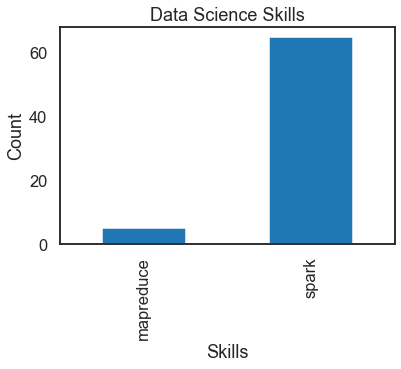

In [46]:
pseries = pd.Series(skill_set)
pseries.sort_values(ascending=False)

pseries.plot(kind = 'bar')
## set the title to Score Comparison
plt.title('Data Science Skills')
plt.xlabel('Skills')
plt.ylabel('Count')
plt.show()

Some more regular expressions:
=================

Another Example
================

Designed by Katharine Jarmul
----------------------------

https://github.com/kjam/python-web-scraping-tutorial




Scraping Happy Hours
====================

Scrape the happy hour list of LA for personal preferences

http://www.downtownla.com/3_10_happyHours.asp?action=ALL

This example is part of her talk about data scraping at PyCon2014. She is a really good speaker and I enjoyed watching her talk. Check it out: http://www.youtube.com/watch?v=p1iX0uxM1w8

In [26]:
stuff_i_like = ['burger', 'sushi', 'sweet potato fries', 'BBQ','beer']
found_happy_hours = []
my_happy_hours = []
# First, I'm going to identify the areas of the page I want to look at
url = 'https://downtownla.com/explore/dining-and-drinks/happy-hour-finder'
source = urllib.request.urlopen(url).read()
tables = bs4.BeautifulSoup(source)

In [54]:
print(bs4.__version__)


4.9.1


In [28]:
# Then, I'm going to sort out the *exact* parts of the page
# that match what I'm looking for...
for t in tables.find_all('div', {'class': "gcard-offer"}):
    text = t.text
    for s in t.find_next_siblings():
        text += '\n' + s.text
    found_happy_hours.append(text)

print ("The scraper found %d happy hours!" % len(found_happy_hours))
print (found_happy_hours)

The scraper found 66 happy hours!
['Happy Hour$5 House Beer', "Bar & KitchenBar & Kitchen is a new-American restaurant with influences of Spanish and farm-fresh local Californian cuisine. Matched to this, Bar & Kitchen's beverages focus on wines from small producers, beers from craft brewers, and classic mixed drink.", 'Aperitivo Hour$8. Includes Hospitality and Snack Trio.', 'Weekday Happy HourDrink Specials', 'Happy Hour3 big plasma screen TVs and a big screen projection screen, pool, jukebox', '$5 Happy HourFRIED ZUCCHINI \r\nFRENCH FRIES \r\nTRUFFLE FRIES \r\nMOZZARELLA STICKS \r\nSALSA DIP & CHIPS \r\nARTICHOKE DIP & CHIPS \r\nCALAMARI RINGS', 'Weekday Happy HourBrewpub offering craft beers, American grub & city skyline views from 4th-floor outdoor patio.', 'Weekday Happy Hour$5 Beers, $7 Beer & Shot, $3.50 Tacos, $6 Margaritas', 'Daily Happy Hour$6 draft beers, $6 wine and well drinks, $9 specialty cocktails. Great food specials.', 'Late Night Happy Hour$6 draft beers, $6 wine an

In [29]:
# Now I'm going to loop through the food I like
# and see if any of the happy hour descriptions match
for food in stuff_i_like:
    for hh in found_happy_hours:
        # checking for text AND making sure I don't have duplicates
        if food in hh and hh not in my_happy_hours:
            print ("YAY! I found some %s!" % food)
            my_happy_hours.append(hh)

print ("I think you might like %d of them, yipeeeee!" % len(my_happy_hours))

YAY! I found some sushi!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
YAY! I found some beer!
I think you might like 18 of them, yipeeeee!


In [76]:
# Now, let's make a mail message we can read:
message = 'Hey Katharine,\n\n\n'
message += 'OMG, I found some stuff for you in Downtown, take a look.\n\n'
message += '==============================\n'.join(my_happy_hours)
message = message.encode('utf-8')
# To read more about encoding:
# http://diveintopython.org/xml_processing/unicode.html
#message = message.replace('\t', '').replace('\r', '')
#message += '\n\nXOXO,\n Your Py Script'

print (message)

b"Hey Katharine,\n\n\nOMG, I found some stuff for you in Downtown, take a look.\n\nFinish off your long workday or kick-start your weekend with Happy Hour in DTLA. Eclectic venues, top-shelf mixologists, and an open invitation to let off some steam.\n\n\n\n\n\n\n\nAll Neighborhoods\n\n\nAll Neighborhoods\nArts District\nBunker Hill\nCentral City East\nCivic Center\nEl Pueblo\nFashion District\nFinancial District\nHistoric Downtown\nJewelry District\nLittle Tokyo\nSouth Park\n\n\n\n\n\nAll Neighborhoods\n\n\n\n\n\n\n\n\n\nWednesday\n\n\nAll Days\nSunday\nMonday\nTuesday\nWednesday\nThursday\nFriday\nSaturday\n\n\n\n\n\nWednesday\n\n\n\n\n\n\n\nClear Filters\n\n\n\n\n\n\n\n\n\nArts District\n\n\nHappy Hour at Arts District Brewing Company\nMonday-Thursday3:00pm - 12:00am\nHappy Hour$5 House Beer\n\n\n\n\n\nFinancial District\n\n\nBar & Kitchen at Bar & Kitchen\nMonday-Friday5:00pm - 7:00pm\nBar & KitchenBar & Kitchen is a new-American restaurant with influences of Spanish and farm-fresh 

Getting Data with an API
=========================

* API: application programming interface
* some sites try to make your life easier
* Twitter, New York Times, ImDB, rotten Tomatoes, Yelp, ...

Rotten Tomatoes
===============

![The Wizard of Oz](images/wiz_oz.png "The wizard of Oz")

http://www.rottentomatoes.com/top/


API keys
=========

* required for data access
* identifies application (you)
* monitors usage
* limits rates

Rotten Tomatoes Key
===================

http://developer.rottentomatoes.com/member/register

In [88]:
import json
import requests

#api_key =  #put your key here

#url = 'https://www.rottentomatoes.com/top'
#data = urllib.request.urlopen(url).read()
#print (data)

JSON
======

* JavaScript Object Notation
* human readable
* transmit attribute-value pairs

In [82]:
a = {'a': 1, 'b':2}
s = json.dumps(a)
a2 = json.loads(s)

## a is a dictionary
print (a)
## vs s is a string containing a in JSON encoding
print (s)
## reading back the keys are now in unicode
print (a2)

{'a': 1, 'b': 2}
{"a": 1, "b": 2}
{'a': 1, 'b': 2}


In [84]:
## create dictionary from JSON 
dataDict = json.loads(data)

## explore dictionary
print ("Starting keys:")
print (dataDict.keys())

## there is a key named `movies` containing a list of movies as a value
movies = dataDict['movies']

## each element of the list `movies` is a dictionary
print ("Movie keys:")
print (movies[0].keys())


JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [71]:
## one of the keys is called `ratings`
## the value is yet another dictionary
print "Movie rating keys:"
print movies[0]['ratings'].keys()
print

## so we made it all the way to find the critics score
print "Movie critics score rating:"
print movies[0]['ratings']['critics_score']
print

Movie rating keys:
[u'critics_score', u'audience_score', u'critics_rating', u'audience_rating']

Movie critics score rating:
30



Quiz
=====

* build a list with critics scores
* build a list with audience scores

In [49]:
# critics scores list
critics_scores = [m['ratings']['critics_score'] for m in movies]

# audience scores list
audience_scores = [m['ratings']['audience_score'] for m in movies]

The following code shows how to create a pandas data frame with the data we gathered from the webpage.
Beware of the `set_index()` function in pandas. Per default it does not change the actual data frame! You need to either reassign the output or set the `inplace` argument to `True`.

In [50]:
## create pandas data frame with critics and audience score
scores = pd.DataFrame(data=[critics_scores, audience_scores]).transpose()
scores.columns = ['critics', 'audience']

## also create a list with all movie titles
movie_titles = [m['title'] for m in movies]

## set index of dataFrame BEWARE of inplace!
scores.set_index([movie_titles])

## the line above does not changes scores!
## You need to either reassign

scores = scores.set_index([movie_titles])

## or set the inplace argument to True
scores.set_index([movie_titles], inplace=True)
scores.head(3)

,critics,audience
Insurgent,30,62
Mad Max: Fury Road,97,88
Home,45,65


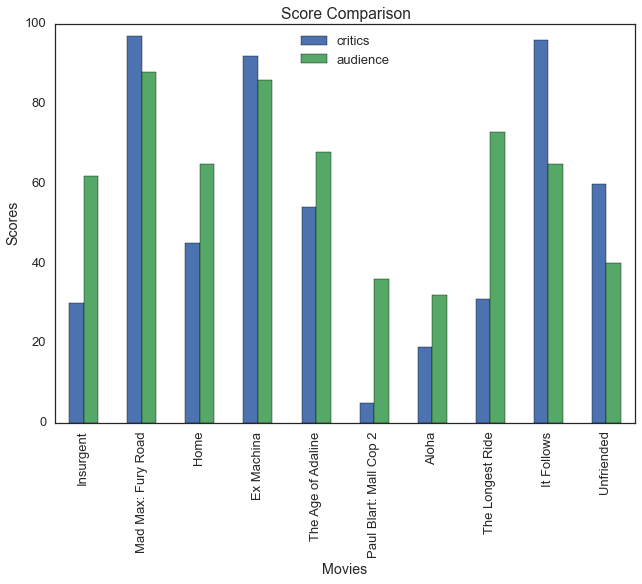

In [51]:
## create a bar plot with the data
## notice that we are using the data frame itself and call its plot function
scores.plot(kind = 'bar')

## set the title to Score Comparison
plt.title('Score Comparison')

## set the x label
plt.xlabel('Movies')

## set the y label
plt.ylabel('Scores')

In [52]:
## show the plot
plt.show()

Twitter Example:
================

* API a bit more complicated
* libraries make life easier
* python-twitter

https://github.com/bear/python-twitter

What we are going to do is scrape Joe's twitter account, and then filter it for the interesting tweets. Defining interesting as tweets that have be re-tweeted at least 10 times. 


In [53]:
import twitter

## define the necessary keys
cKey = twitterAPI_key()
cSecret = twitterAPI_secret()
aKey = twitterAPI_access_token_key()
aSecret = twitterAPI_access_token_secret()

## create the api object with the twitter-python library
api = twitter.Api(consumer_key=cKey, consumer_secret=cSecret, access_token_key=aKey, access_token_secret=aSecret)


In [54]:
## get the user timeline with screen_name = 'stat110'
twitter_statuses = api.GetUserTimeline(screen_name = 'stat110')

## create a data frame
## first get a list of panda Series or dict
pdSeriesList = [pd.Series(t.AsDict()) for t in twitter_statuses]

## then create the data frame
data = pd.DataFrame(pdSeriesList)

data.head(2)

,created_at,favorite_count,favorited,hashtags,id,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_user_id,lang,media,retweet_count,retweeted,retweeted_status,source,text,truncated,urls,user,user_mentions
0,Mon Sep 07 22:17:04 +0000 2015,2,False,NaN,641012335738421248,lallen1618,6.409978e+17,2355874964,en,NaN,NaN,False,NaN,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",@lallen1618 @wzchen @AriBFriedman Good luck wi...,False,NaN,"{u'id': 184543773, u'profile_sidebar_fill_colo...","[{u'screen_name': u'lallen1618', u'id': 235587..."
1,Mon Sep 07 18:51:12 +0000 2015,NaN,False,NaN,640960524784640001,albertocairo,6.409594e+17,34255829,en,NaN,NaN,False,NaN,"<a href=""http://twitter.com/download/iphone"" r...",@albertocairo @Sulliview @NateSilver538 But a ...,False,NaN,"{u'id': 184543773, u'profile_sidebar_fill_colo...","[{u'screen_name': u'albertocairo', u'id': 3425..."


In [55]:
## filter tweets with enough retweet_count
maybe_interesting = data[data.retweet_count>20]

## get the text of these tweets
tweet_text = maybe_interesting.text

## print them out
text = tweet_text.values

for t in text:
    print '######'
    print t

######
RT @NateSilver538: .@Sulliview: The fundamental sin is cherry-picking evidence to fit a narrative. Can happen in both "reported" and "data-…
######
RT @Agent_Analytics: Watch out #datascientist 's. Always read the #job decscription. #data #DataScience #BigData #analytics #jokes http://t…
######
RT @rasbt: just felt like writing this morning ;) "Python, Machine Learning &amp; Language Wars. A Highly Subjective Point of View" http://t.co…
######
RT @ericcolson: Linear Algebra: took this course by G Strang years ago. Excellent and free! via @ajinkyakale 
http://t.co/UAqeHMzs4a http:/…


Extracting columns:
===================

__Warning:__ The returned column `tweet_text` is a `view` on the data
    
* it is not a copy
* you change the Series => you change the DataFrame

Below is another example of such a view:

In [56]:
## create a view for favorite_count on maybe_interesting
view = maybe_interesting['favorite_count']
print '-----------------'
print "This is view:"
print view
## change a value
view[8] = 9999

## look at original frame
print '-----------------'
print "This is view after changing view[8]"
print view

print '-----------------'
print "This is maybe_interesting after changing view[8]"
print "It changed too!"
print maybe_interesting['favorite_count']

## to avoid this you can use copy
independent_data = maybe_interesting['favorite_count'].copy()
independent_data[10] = 999
print '-----------------'
print "This is independent_data after changed at 10:"
print independent_data
print '-----------------'
print "This is maybe_interesting after changing independent_data:"
print "It did not change because we only changed a copy of it"
print maybe_interesting['favorite_count']

C:\Python27\lib\site-packages\ipykernel\__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Python27\lib\site-packages\pandas\core\series.py:664: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.loc[key] = value


-----------------
This is view:
3   NaN
5   NaN
6   NaN
7   NaN
Name: favorite_count, dtype: float64
-----------------
This is view after changing view[8]
3     NaN
5     NaN
6     NaN
7     NaN
8    9999
Name: favorite_count, dtype: float64
-----------------
This is maybe_interesting after changing view[8]
It changed too!
3     NaN
5     NaN
6     NaN
7     NaN
8    9999
Name: favorite_count, dtype: float64
-----------------
This is independent_data after changed at 10:
3      NaN
5      NaN
6      NaN
7      NaN
8     9999
10     999
Name: favorite_count, dtype: float64
-----------------
This is maybe_interesting after changing independent_data:
It did not change because we only changed a copy of it
3     NaN
5     NaN
6     NaN
7     NaN
8    9999
Name: favorite_count, dtype: float64


C:\Python27\lib\site-packages\IPython\core\interactiveshell.py:3066: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


What we covered today:
============

* Pandas data frames
* Guidelines for friendly scraping
* Scraping html sites
* Scraping with Api's
* Basic data cleanup


Further material
================

* I highly recommend Katharine Jarmul's scraping tutorials
* For example [this one](https://www.youtube.com/watch?v=p1iX0uxM1w8)
* Pandas has extensive [documentation](http://pandas.pydata.org/pandas-docs/stable/)
* Especially the [tem minutes to pandas chapter](http://pandas.pydata.org/pandas-docs/stable/10min.html)

* [Greg Reda](http://www.gregreda.com/2013/10/26/using-pandas-on-the-movielens-dataset/) did a lot more pandas examples for the movie lens data set

In [23]:
%config Completer.use_jedi = False #para lograr el autocompletar


In [5]:
#ten minutes to pandas

df2 = pd.DataFrame(
    {"A": 1.0,
"B": pd.Timestamp("20130102"),
"C": pd.Series(1, index=list(range(4)), dtype="float32"),
"D": np.array([3] * 4, dtype="int32"),
"E": pd.Categorical(["test", "train", "test", "train"]),
 "F": "foo",
}
)
df2

,A,B,C,D,E,F
0,1.0,2013-01-02,1.0,3,test,foo
1,1.0,2013-01-02,1.0,3,train,foo
2,1.0,2013-01-02,1.0,3,test,foo
3,1.0,2013-01-02,1.0,3,train,foo


In [7]:
dates = pd.date_range("20130101", periods=6)

dates


df = pd.DataFrame(np.random.randn(6, 4), index=dates, columns=list("ABCD"))

df

,A,B,C,D
2013-01-01,-0.907301,0.174372,0.458800,1.008940
2013-01-02,1.057310,-0.869850,-2.040749,0.686815
2013-01-03,-0.545697,-1.284504,-0.593788,-0.250979
2013-01-04,2.651811,-0.321981,-0.838634,0.018301
2013-01-05,0.590784,1.922433,-0.451154,-0.462151
2013-01-06,-1.558649,1.762765,-0.018027,0.038415


In [8]:
df2 = df.copy()

df2["E"] = ["one", "one", "two", "three", "four", "three"]

df2

,A,B,C,D,E
2013-01-01,-0.907301,0.174372,0.458800,1.008940,one
2013-01-02,1.057310,-0.869850,-2.040749,0.686815,one
2013-01-03,-0.545697,-1.284504,-0.593788,-0.250979,two
2013-01-04,2.651811,-0.321981,-0.838634,0.018301,three
2013-01-05,0.590784,1.922433,-0.451154,-0.462151,four
2013-01-06,-1.558649,1.762765,-0.018027,0.038415,three


In [11]:
s1 = pd.Series([1, 2, 3, 4, 5, 6], index=pd.date_range("20130102", periods=6))
s1

df["F"] = s1
df

,A,B,C,D,F
2013-01-01,-0.907301,0.174372,0.458800,1.008940,NaN
2013-01-02,1.057310,-0.869850,-2.040749,0.686815,1.0
2013-01-03,-0.545697,-1.284504,-0.593788,-0.250979,2.0
2013-01-04,2.651811,-0.321981,-0.838634,0.018301,3.0
2013-01-05,0.590784,1.922433,-0.451154,-0.462151,4.0
2013-01-06,-1.558649,1.762765,-0.018027,0.038415,5.0


In [13]:
df.at[dates[0], "A"] = 0
df

,A,B,C,D,F
2013-01-01,0.000000,0.174372,0.458800,1.008940,NaN
2013-01-02,1.057310,-0.869850,-2.040749,0.686815,1.0
2013-01-03,-0.545697,-1.284504,-0.593788,-0.250979,2.0
2013-01-04,2.651811,-0.321981,-0.838634,0.018301,3.0
2013-01-05,0.590784,1.922433,-0.451154,-0.462151,4.0
2013-01-06,-1.558649,1.762765,-0.018027,0.038415,5.0


In [14]:
df.iat[0, 1] = 0
df

,A,B,C,D,F
2013-01-01,0.000000,0.000000,0.458800,1.008940,NaN
2013-01-02,1.057310,-0.869850,-2.040749,0.686815,1.0
2013-01-03,-0.545697,-1.284504,-0.593788,-0.250979,2.0
2013-01-04,2.651811,-0.321981,-0.838634,0.018301,3.0
2013-01-05,0.590784,1.922433,-0.451154,-0.462151,4.0
2013-01-06,-1.558649,1.762765,-0.018027,0.038415,5.0


In [16]:
df.loc[:, "D"] = np.array([5] * len(df))
df2 = df.copy()
df2[df2 > 0] = -df2
df2

,A,B,C,D,F
2013-01-01,0.000000,0.000000,-0.458800,-5,NaN
2013-01-02,-1.057310,-0.869850,-2.040749,-5,-1.0
2013-01-03,-0.545697,-1.284504,-0.593788,-5,-2.0
2013-01-04,-2.651811,-0.321981,-0.838634,-5,-3.0
2013-01-05,-0.590784,-1.922433,-0.451154,-5,-4.0
2013-01-06,-1.558649,-1.762765,-0.018027,-5,-5.0


In [27]:
tuples = list(
            zip(
                *[
                    ["bar", "bar", "baz", "baz", "foo", "foo", "qux", "qux"],
                    ["one", "two", "one", "two", "one", "two", "one", "two"],
                ]
            )
)

print(tuples)
index = pd.MultiIndex.from_tuples(tuples, names=["first", "second"])
print(index)
df = pd.DataFrame(np.random.randn(8, 2), index=index, columns=["A", "B"])
print(df)
df2 = df[:4]
df2

[('bar', 'one'), ('bar', 'two'), ('baz', 'one'), ('baz', 'two'), ('foo', 'one'), ('foo', 'two'), ('qux', 'one'), ('qux', 'two')]
MultiIndex([('bar', 'one'),
            ('bar', 'two'),
            ('baz', 'one'),
            ('baz', 'two'),
            ('foo', 'one'),
            ('foo', 'two'),
            ('qux', 'one'),
            ('qux', 'two')],
           names=['first', 'second'])
                     A         B
first second                    
bar   one    -0.399350 -2.152928
      two     1.254563 -0.745741
baz   one    -0.845350 -0.562733
      two    -0.627859 -0.391380
foo   one    -1.211504  2.110880
      two     1.950146  2.627878
qux   one     1.158146  0.566224
      two     0.615102  0.177042


A         B
first second                    
bar   one    -0.399350 -2.152928
      two     1.254563 -0.745741
baz   one    -0.845350 -0.562733
      two    -0.627859 -0.391380

In [30]:
rng = pd.date_range("1/1/2012", periods=100, freq="S")
rng
ts = pd.Series(np.random.randint(0, 500, len(rng)), index=rng)
ts
ts.resample("5Min").sum()

2012-01-01    25435
Freq: 5T, dtype: int64

In [10]:
url = 'https://www.google.com/'
source = urllib.request.urlopen(url).read()
#print (source)
google = bs4.BeautifulSoup(source)
google.findAll('img')  


[<img alt="Google" height="92" id="hplogo" src="/images/branding/googlelogo/1x/googlelogo_white_background_color_272x92dp.png" style="padding:28px 0 14px" width="272"/>]

In [25]:
url2 = 'https://www.python.org/'
source2= urllib.request.urlopen(url2).read()
soup = bs4.BeautifulSoup(source)
print(source2[0:10])



b'<!doctype '


In [39]:
from lxml import html

simple_page = open('///Users/aliciagrande/Documents/LearnPython/HTML-CSS/first_test.html').read()
simple_tree = html.document_fromstring(simple_page)

In [41]:
simple_tree.xpath('//p')

[<Element p at 0x7fb172b4aa90>]

In [45]:
simple_tree.xpath('//h1')
simple_tree.xpath('//h1/text()')

['Welcome To My First Web Page']

In [43]:
simple_tree.xpath('//head')

[<Element head at 0x7fb172b541d0>]

In [46]:
simple_tree.xpath('*/@*')

[]